In [ ]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import random
import pygame
from stable_baselines3 import DQN, PPO, A2C
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.callbacks import BaseCallback
import os
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import time


# Custom callback to log every `x` steps to TensorBoard
class CustomTensorBoardCallback(BaseCallback):
    def __init__(self, save_freq: int, verbose=0):
        super().__init__(verbose)
        self.save_freq = save_freq

    def _on_step(self) -> bool:
        # Log to TensorBoard every `save_freq` steps
        if self.num_timesteps % self.save_freq == 0:
            self.logger.record('timesteps', self.num_timesteps)
            self.logger.dump(self.num_timesteps)
        return True

class SnakeEnv(gym.Env):
    """
    Custom Environment for Snake Game.
    """
    metadata = {'render.modes': ['human']}

    def __init__(self, grid_size=10):
        super(SnakeEnv, self).__init__()
        self.grid_size = grid_size  # Size of the grid
        self.action_space = spaces.Discrete(4)  # Up, Down, Left, Right
        self.observation_space = spaces.Box(
            low=0, high=1, shape=(grid_size, grid_size, 3), dtype=np.float32
        )
        self.reset()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        initial_position = (self.grid_size // 2, self.grid_size // 2)
        self.snake = [initial_position, (initial_position[0], initial_position[1] - 1)]  # Start with length 2
        self.food = self._generate_food()
        self.direction = (0, 1)  # Initially moving right
        self.done = False
        self.previous_positions = set()
        self.previous_positions.add(tuple(self.snake))
        return self._get_obs(), {}

    def step(self, action):
        if action == 0:  # Up
            self.direction = (-1, 0)
        elif action == 1:  # Down
            self.direction = (1, 0)
        elif action == 2:  # Left
            self.direction = (0, -1)
        elif action == 3:  # Right
            self.direction = (0, 1)

        new_head = (
            self.snake[0][0] + self.direction[0],
            self.snake[0][1] + self.direction[1],
        )

        # Check collisions
        if (
            new_head in self.snake
            or not (0 <= new_head[0] < self.grid_size)
            or not (0 <= new_head[1] < self.grid_size)
        ):
            self.done = True
            reward = -10  # Penalize collisions
            return self._get_obs(), reward, self.done, False, {}

        # Calculate distance to food
        old_distance = np.linalg.norm(np.array(self.snake[0]) - np.array(self.food))
        new_distance = np.linalg.norm(np.array(new_head) - np.array(self.food))
        
        # Move snake
        self.snake.insert(0, new_head)
        if new_head == self.food:
            reward = 100  # Reward for eating food
            self.food = self._generate_food()
            self.previous_positions = set()
        else:
            self.snake.pop()
            reward = 1  # Base reward for moving successfully

        # Reward for getting closer to the food
        if new_distance < old_distance:
            reward += 5
        else:
            reward -= 2  # Penalize getting further away

        # Penalize repetitive patterns
        if tuple(self.snake) in self.previous_positions:
            reward -= 25
        else:
            self.previous_positions.add(tuple(self.snake))

        return self._get_obs(), reward, self.done, False, {}

    def render(self):
        block_size = 20
        if not hasattr(self, "screen"):
            pygame.init()
            self.screen = pygame.display.set_mode((self.grid_size * block_size, self.grid_size * block_size), pygame.NOFRAME)
        self.screen.fill((0, 0, 0))  # Clear the screen with black
        # Draw the snake
        for segment in self.snake:
            pygame.draw.rect(self.screen, (0, 255, 0), (segment[1] * block_size, segment[0] * block_size, block_size, block_size))
        # Draw the food
        pygame.draw.rect(self.screen, (255, 0, 0), (self.food[1] * block_size, self.food[0] * block_size, block_size, block_size))
        # Convert the screen to an RGB array
        return pygame.surfarray.array3d(self.screen).swapaxes(0, 1)

    def close(self):
        if hasattr(self, "screen"):
            pygame.display.quit()
            pygame.quit()

    def _generate_food(self):
        while True:
            food = (random.randint(0, self.grid_size - 1), random.randint(0, self.grid_size - 1))
            if food not in self.snake:
                return food

    def _get_obs(self):
        obs = np.zeros((self.grid_size, self.grid_size, 3), dtype=np.float32)
        for segment in self.snake:
            obs[segment[0], segment[1], 0] = 1  # Snake segments
        obs[self.food[0], self.food[1], 1] = 1  # Food
        obs[self.snake[0][0], self.snake[0][1], 2] = 1  # Head of the snake
        return obs


# Set up logging for TensorBoard
log_dir = "./logs/snake/"
os.makedirs(log_dir, exist_ok=True)

# Define the algorithms to test
algorithms = {
    "DQN": DQN,
    "PPO": PPO,
    "A2C": A2C
}

# Specify the number of steps to log to TensorBoard
log_freq = 5000  # Save to TensorBoard every 1000 steps

# Loop through different algorithms and train them
for algo_name, algo_class in algorithms.items():
    print(f"Training {algo_name}...")
    # Ensure a fresh environment for each algorithm
    env = SnakeEnv()  
    check_env(env)  # Re-check the environment to avoid misconfiguration
    
    model = algo_class("MlpPolicy", env, verbose=1, tensorboard_log=log_dir)
    
    # Add the custom callback to log every `log_freq` steps
    callback = CustomTensorBoardCallback(save_freq=log_freq)
    
    model.learn(total_timesteps=1000000, callback=callback)
    
    # Close the environment explicitly
    env.close()
    env.reset()
    print(f"Training for {algo_name} completed. You can monitor using tensorboard --logdir=./logs")


def play_game_in_notebook(env, model, episodes=1, render_delay=0.1):
    """Play the game using the trained model and display frames in a Jupyter Notebook."""
    for _ in range(episodes):
        obs, _ = env.reset()
        done = False
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, _, done, _, _ = env.step(action)

            frame = env.render()
            print(type(frame))
            if isinstance(frame, np.ndarray):
                plt.imshow(frame)
                plt.axis('off')
                display(plt.gcf())
                plt.close()
                pygame.time.delay(int(render_delay * 1000))
                clear_output(wait=True)

    env.close()


Training DQN...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/Users/inaki.gorostiaga/Personal/games/venv-games/lib/python3.11/site-packages/stable_baselines3/common/env_checker.py:54: UserWarning: It seems that your observation  is an image but its `dtype` is (float32) whereas it has to be `np.uint8`. If your observation is not an image, we recommend you to flatten the observation to have only a 1D vector
  warnings.warn(
/Users/inaki.gorostiaga/Personal/games/venv-games/lib/python3.11/site-packages/stable_baselines3/common/env_checker.py:62: UserWarning: It seems that your observation space  is an image but the upper and lower bounds are not in [0, 255]. Because the CNN policy normalize automatically the observation you may encounter issue if the values are not in that range.
  warnings.warn(
/Users/inaki.gorostiaga/Personal/games/venv-games/lib/python3.11/site-packages/stable_baselines3/common/env_checker.py:75: UserWarning: The minimal resolution for an image is 36x36 for the default `CnnPolicy`. You might need to use a custom features extrac

Logging to ./logs/snake/DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 4        |
|    ep_rew_mean      | -6       |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 6454     |
|    time_elapsed     | 0        |
|    total_timesteps  | 16       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 4        |
|    ep_rew_mean      | 9        |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 7504     |
|    time_elapsed     | 0        |
|    total_timesteps  | 32       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 3.33     |
|    ep_rew_mean      | 2.92     |
|    exploration_rate | 1        |
| time/               |  

/Users/inaki.gorostiaga/Personal/games/venv-games/lib/python3.11/site-packages/stable_baselines3/common/env_checker.py:54: UserWarning: It seems that your observation  is an image but its `dtype` is (float32) whereas it has to be `np.uint8`. If your observation is not an image, we recommend you to flatten the observation to have only a 1D vector
  warnings.warn(
/Users/inaki.gorostiaga/Personal/games/venv-games/lib/python3.11/site-packages/stable_baselines3/common/env_checker.py:62: UserWarning: It seems that your observation space  is an image but the upper and lower bounds are not in [0, 255]. Because the CNN policy normalize automatically the observation you may encounter issue if the values are not in that range.
  warnings.warn(
/Users/inaki.gorostiaga/Personal/games/venv-games/lib/python3.11/site-packages/stable_baselines3/common/env_checker.py:75: UserWarning: The minimal resolution for an image is 36x36 for the default `CnnPolicy`. You might need to use a custom features extrac

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 3.75     |
|    ep_rew_mean     | -7.77    |
| time/              |          |
|    fps             | 4364     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 4.12        |
|    ep_rew_mean          | 3.52        |
| time/                   |             |
|    fps                  | 3073        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.009652916 |
|    clip_fraction        | 0.0594      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -0.0012     |
|    learning_rate        | 0.

In [16]:
%load_ext tensorboard
%tensorboard --logdir ./logs/snake --host localhost --port 6006

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 78967), started 1:01:57 ago. (Use '!kill 78967' to kill it.)

In [17]:
## DQN, PPO, A2C
model = PPO("MlpPolicy", env, verbose=1)
model.learn(total_timesteps=1000000)
model.save(f"models/snake_PPO")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 3.8      |
|    ep_rew_mean     | -2.84    |
| time/              |          |
|    fps             | 5002     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 4.72        |
|    ep_rew_mean          | 2.11        |
| time/                   |             |
|    fps                  | 3347        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.021172006 |
|    clip_fraction        | 0.0908      |
|    clip_range           | 0.2         |
|    entropy_loss   

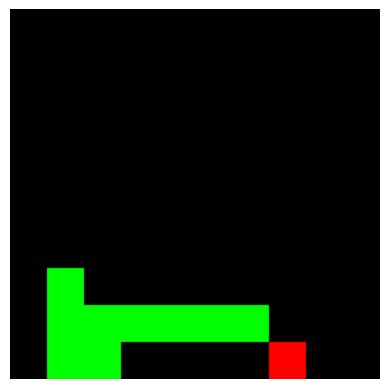

In [ ]:
%%time
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
import time

def play_game_in_notebook(env, model, episodes=1, render_delay=0.2):
    """
    Play the game using the trained model and display it in a Jupyter Notebook.
    
    Args:
        env: Environment to play in.
        model: Trained RL model.
        episodes: Number of episodes to play.
        render_delay: Delay between rendering frames (in seconds).
    """
    for episode in range(episodes):
        obs, _ = env.reset()
        done = False
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, done, _, _ = env.step(action)
            
            # Capture the environment frame
            frame = env.render()
            
            # Display the frame
            plt.imshow(frame)
            plt.axis('off')  # Turn off axes
            clear_output(wait=True)
            display(plt.gcf())
            
            # Pause for the specified delay
            time.sleep(render_delay)
            
        # Clear the final frame
        clear_output(wait=True)
    env.close()  # Close the environment after all episodes

    


trained_model = algo_class.load("models/snake_PPO")
play_game_in_notebook(SnakeEnv(), trained_model, episodes=5, render_delay=0.1)